Oversampling > 2x suggested for reliable results in Fresnel propagation.


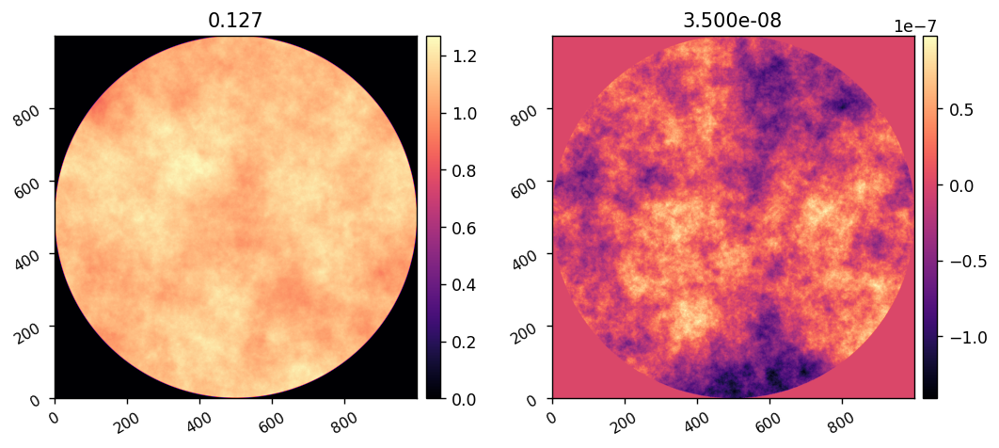

In [1]:
import numpy as np
import astropy.units as u
from astropy.io import fits
import copy
import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Rectangle
from importlib import reload

from scipy.optimize import minimize

import scoobpsf
import scoobpsf.scoob_rmad as rmad
import scoobpsf.utils as utils
from scoobpsf.math_module import xp, _scipy, ensure_np_array
from scoobpsf.imshows import imshow1, imshow2, imshow3

import lina
import lina.adefc as adefc

reload(utils)
WFE, mask = utils.generate_wfe(diam=10*u.mm,
                                npix=1000, oversample=1,
                                wavelength=650*u.nm,
                                opd_index=2.75, amp_index=3,
                                opd_rms=35*u.nm, amp_rms=0.05,
                                remove_modes=12)

wfe_amp = xp.abs(WFE)
wfe_opd = xp.angle(WFE)*650e-9/2/np.pi
rms_amp = xp.sqrt(xp.mean(xp.square(wfe_amp[mask]-1)))
rms_opd = xp.sqrt(xp.mean(xp.square(wfe_opd[mask])))
imshow2(wfe_amp, wfe_opd,  f'{rms_amp:.3f}', f'{rms_opd:.3e}')


# Establish the forward model parameters.

Oversampling > 2x suggested for reliable results in Fresnel propagation.


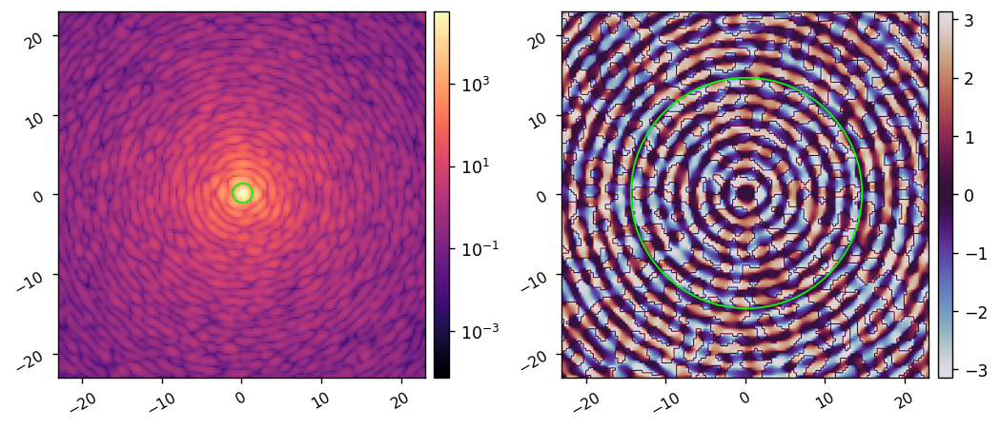

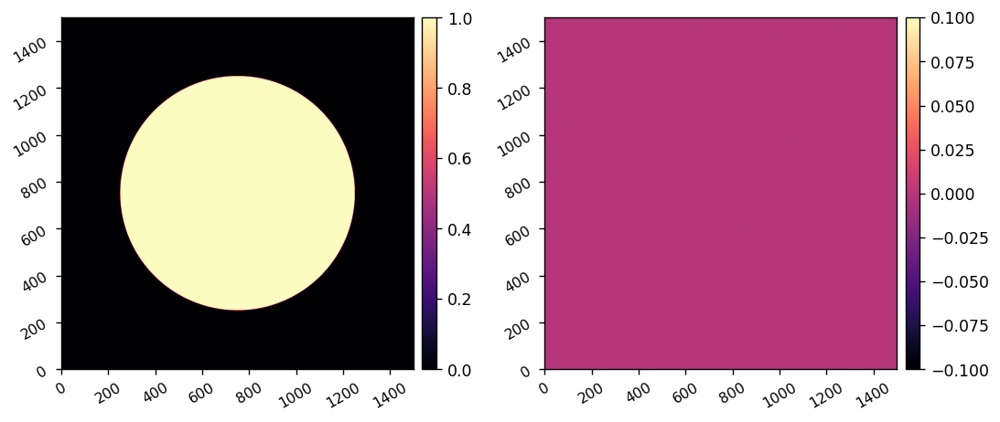

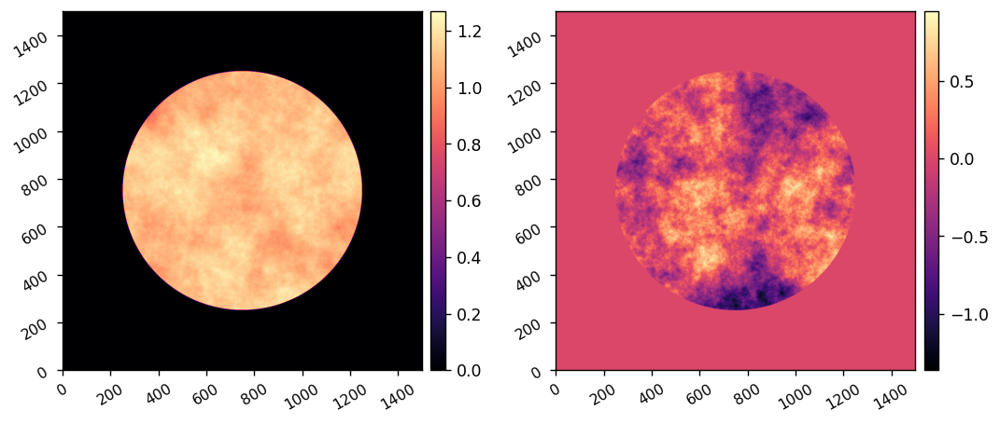

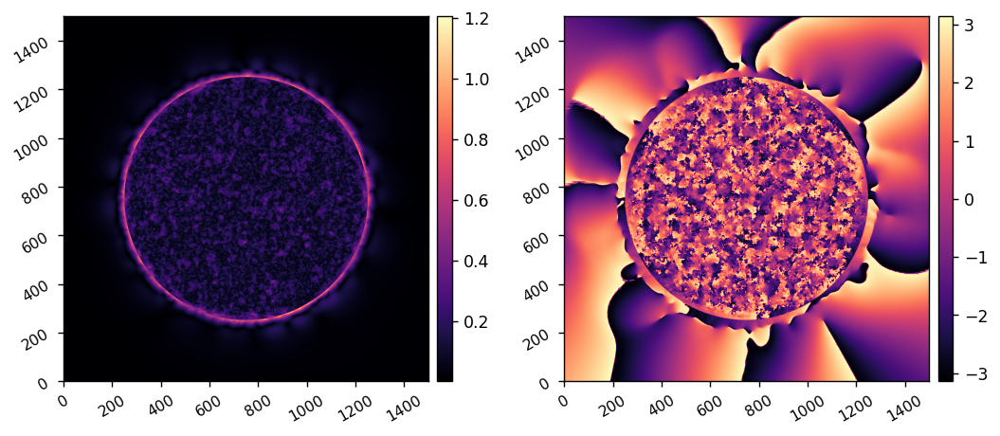

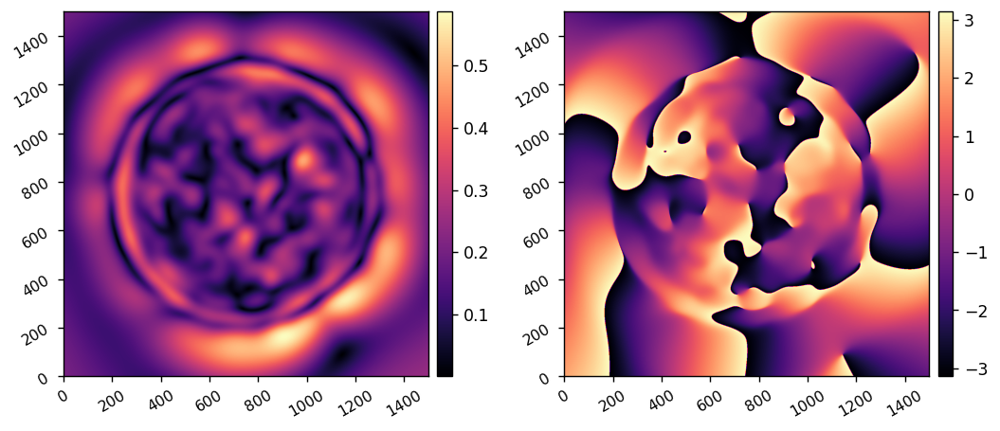

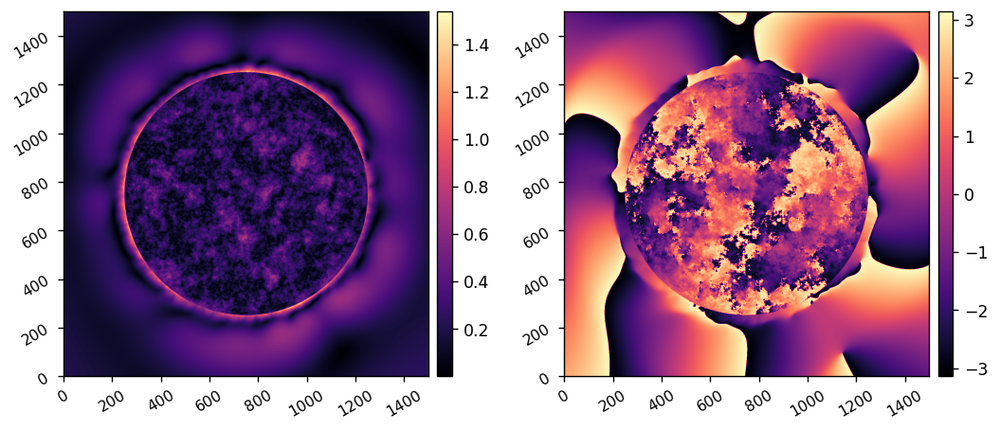

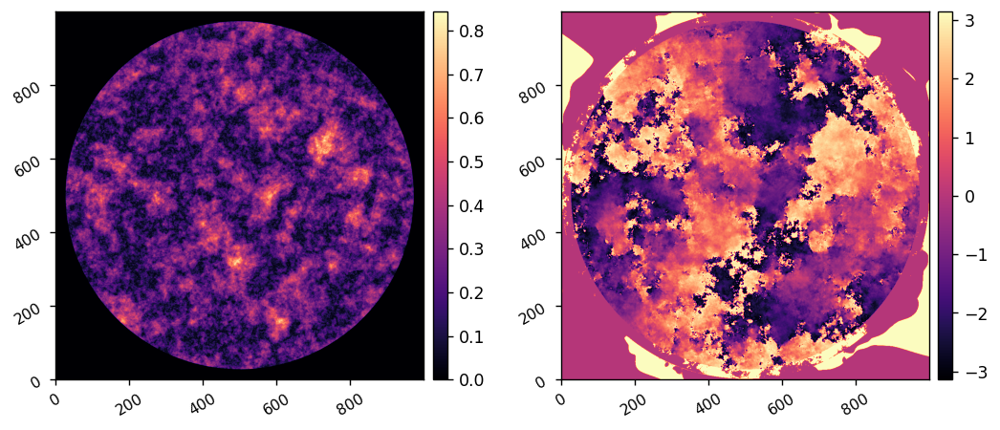

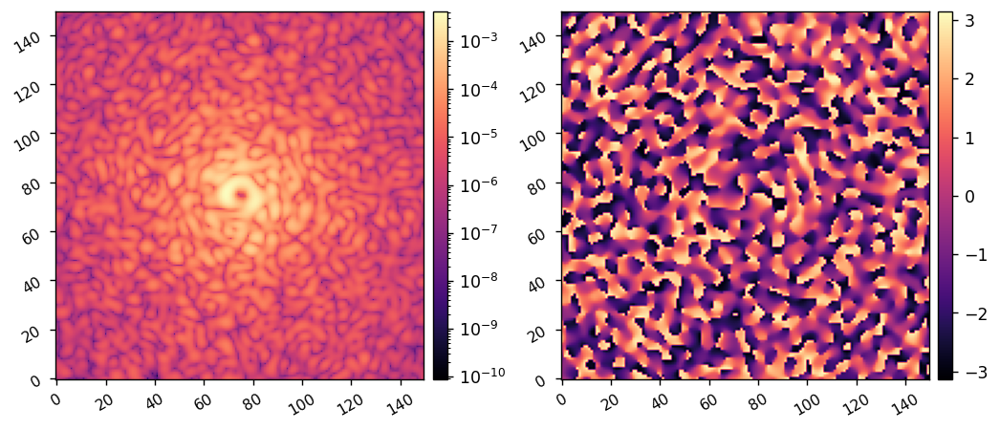

In [2]:
reload(rmad)
reload(scoobpsf.dm)
M = rmad.MODEL()
M.WFE = WFE
acts = np.zeros(M.Nacts)

fpwf_no_vortex = M.forward(acts, use_vortex=False, plot=False)
M.Imax_ref = xp.max( xp.abs(fpwf_no_vortex)**2 )
psf_center = (M.psf_pixelscale_lamD/2, M.psf_pixelscale_lamD/2)
imshow2(xp.abs(fpwf_no_vortex)**2, xp.angle(fpwf_no_vortex), 
        lognorm1=True, pxscl=M.psf_pixelscale_lamD, 
        cmap2='twilight',
        patches1=[Circle(psf_center, 1.22, fill=False, color='lime')], 
        patches2=[Circle(psf_center, M.control_rad, fill=False, color='lime')])
fpwf = M.forward(acts, use_vortex=True, plot=True)


Oversampling > 2x suggested for reliable results in Fresnel propagation.


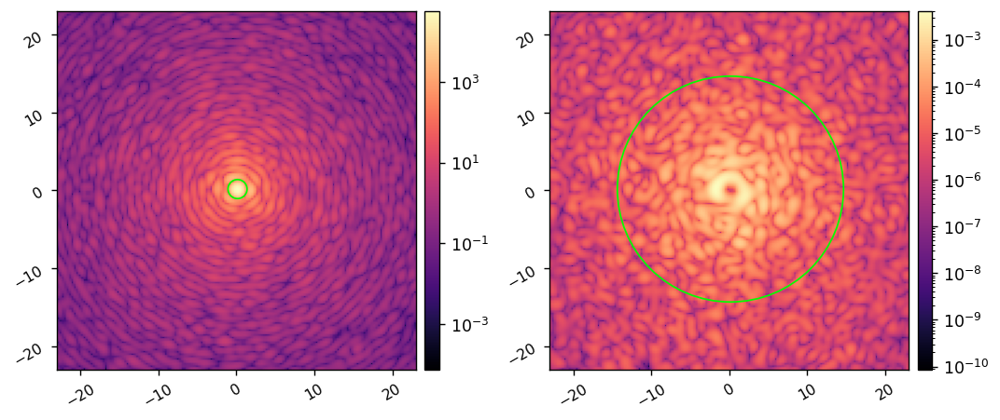

In [3]:
reload(rmad)
I = rmad.MODEL()
I.WFE = WFE

I.use_vortex = False
ref_psf = I.snap()
I.Imax_ref = xp.max(ref_psf)
I.use_vortex = True
ref_coro_im = I.snap()

psf_center = (I.psf_pixelscale_lamD/2, I.psf_pixelscale_lamD/2)
imshow2(ref_psf, ref_coro_im,
        lognorm=True, pxscl=I.psf_pixelscale_lamD, 
        patches1=[Circle(psf_center, 1.22, fill=False, color='lime')], 
        patches2=[Circle(psf_center, I.control_rad, fill=False, color='lime')])


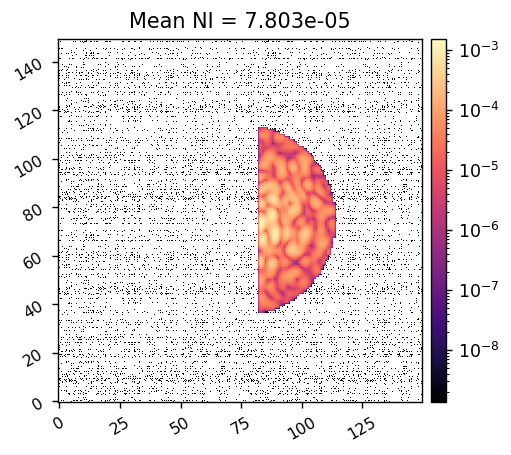

In [4]:
reload(lina.utils)
I.zero_dm()
iwa = 2.5
owa = 12
rot = 0
control_mask = lina.utils.create_annular_focal_plane_mask(I.npsf, I.psf_pixelscale_lamD, irad=iwa, orad=owa, edge=iwa, rotation=rot)
mean_ni = xp.mean(ref_coro_im[control_mask])

imshow1(ref_coro_im*control_mask, f'Mean NI = {mean_ni:.3e}', lognorm=True)


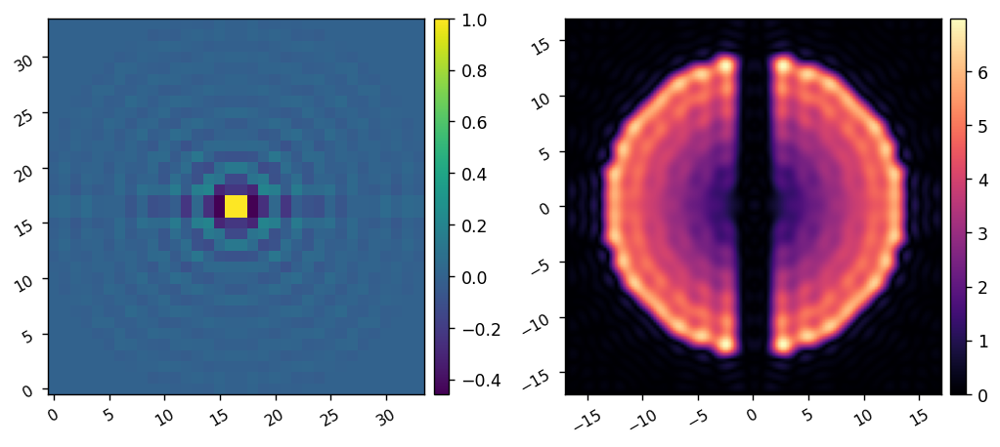

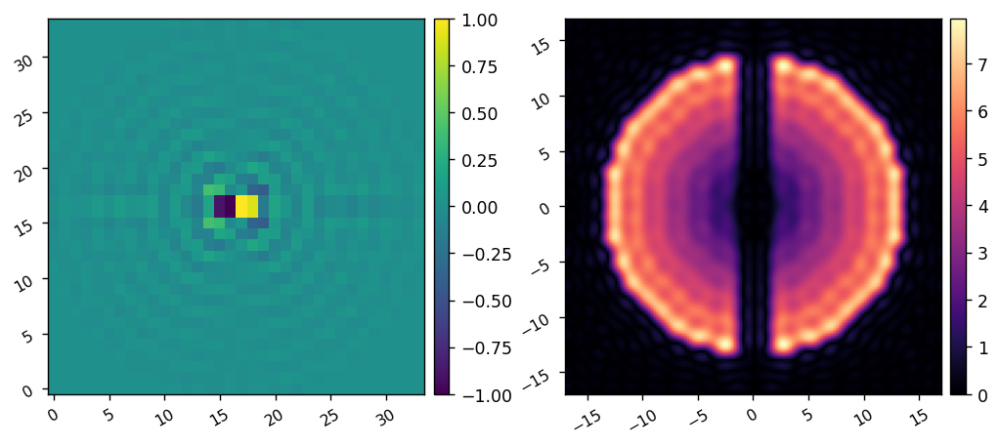

In [5]:
reload(lina.utils)

fourier_probes = lina.utils.create_fourier_probes(I.dm_mask, I.npsf, I.psf_pixelscale_lamD, iwa-0.5, owa+1, fourier_sampling=0.75, 
                                                    nprobes=2,
                                                    plot=True,
                                                    use_weighting=True
                                                    )

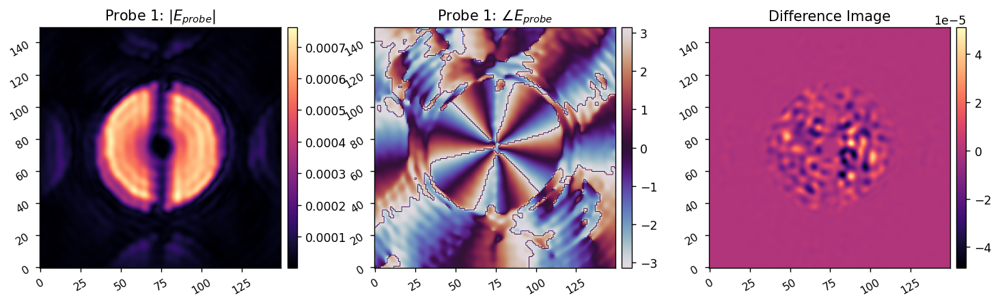

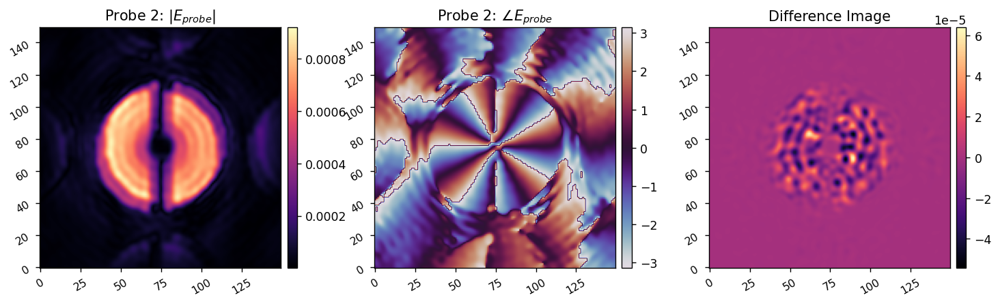

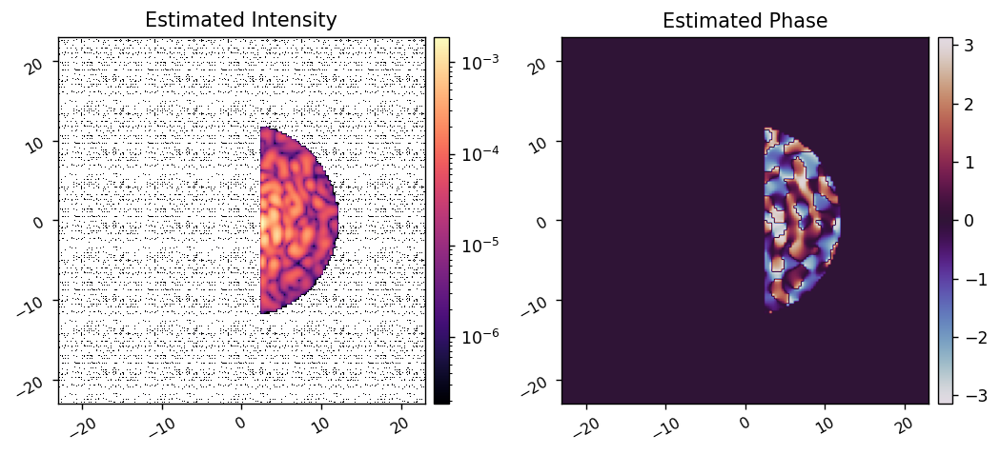

In [6]:
reload(adefc)

acts = np.zeros(I.Nacts)
# acts = fits.getdata('example-data/ad_test_acts.fits')

I.set_dm(rmad.acts_to_command(acts, I.dm_mask))
E_pwp = adefc.run_pwp(I, M, I.get_dm()[M.dm_mask], control_mask, fourier_probes, 5e-9, plot=True)
I_pwp = xp.abs(E_pwp)**2
P_pwp = xp.angle(E_pwp)

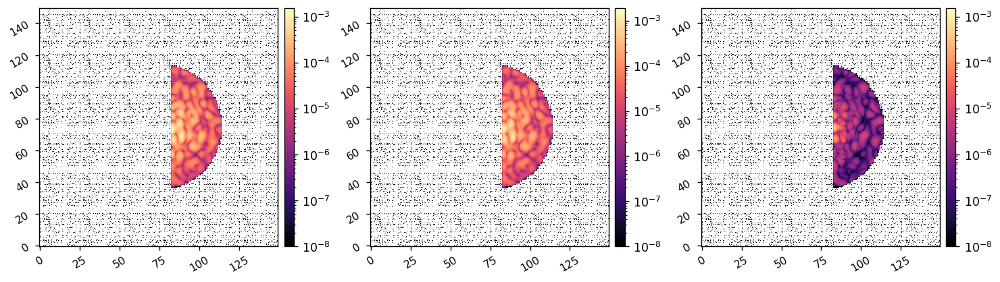

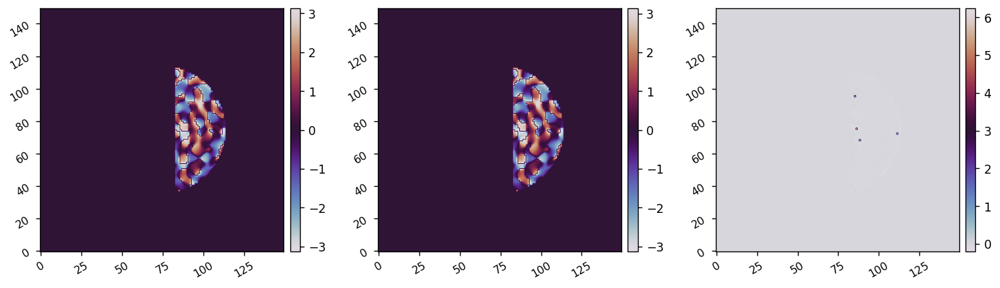

In [8]:
E_ex = I.calc_wf()
I_ex = xp.abs(E_ex)**2 * control_mask
P_ex = xp.angle(E_ex) * control_mask

I_diff = xp.abs(I_ex - I_pwp)
P_diff = P_ex - P_pwp
imshow3(I_ex, I_pwp, I_diff, lognorm=True, 
        vmin1=1e-8, vmin2=1e-8, vmin3=1e-8, vmax3=xp.max(I_ex))
imshow3(P_ex, P_pwp, P_diff, cmap1='twilight', cmap2='twilight', cmap3='twilight')

	Cost-function J_delE: 0.139
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 1.000



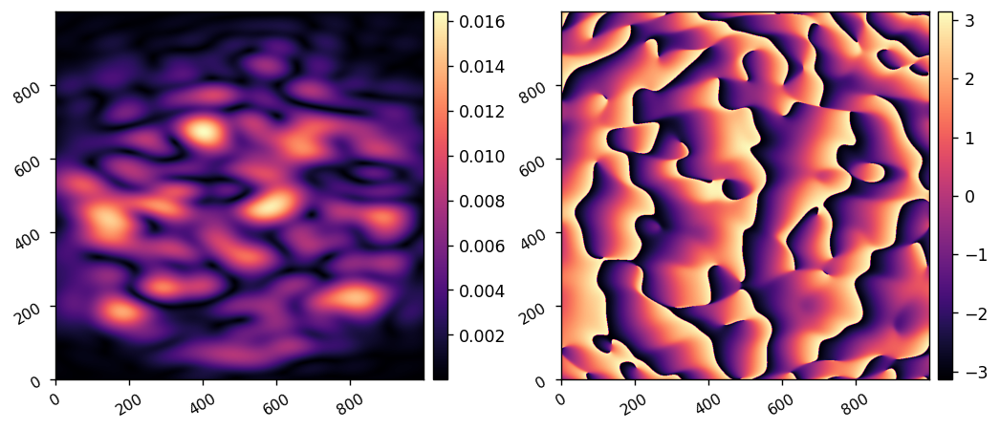

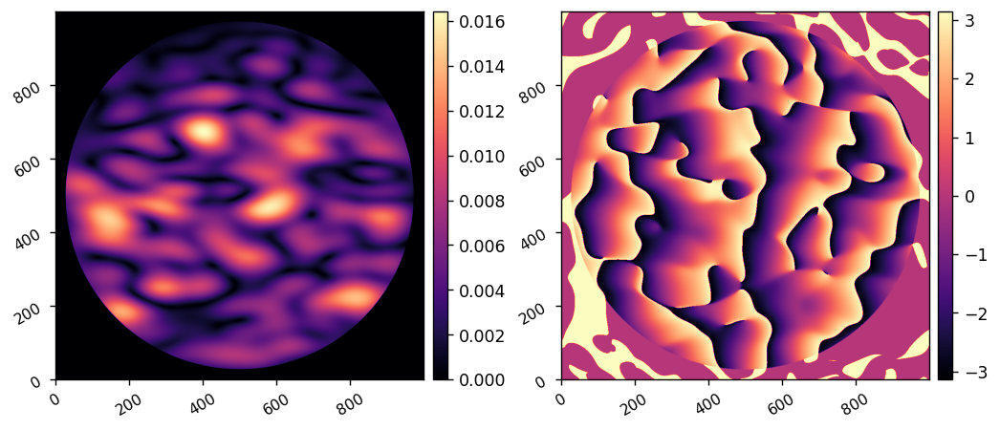

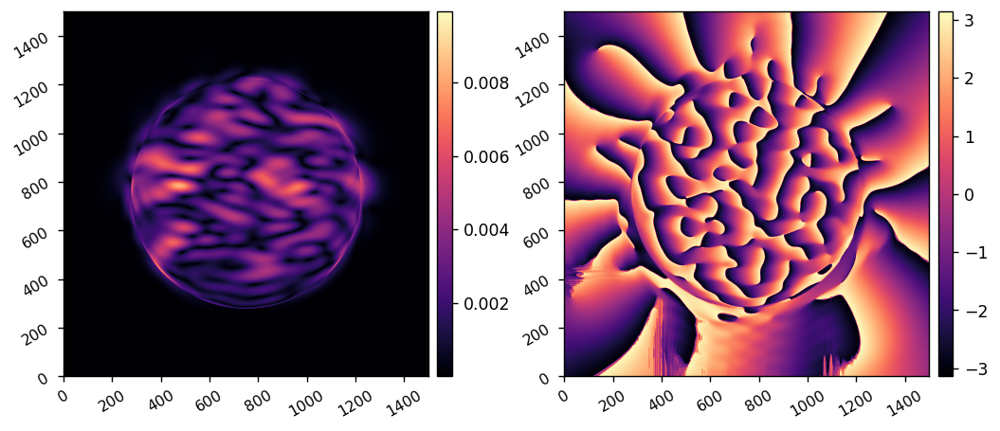

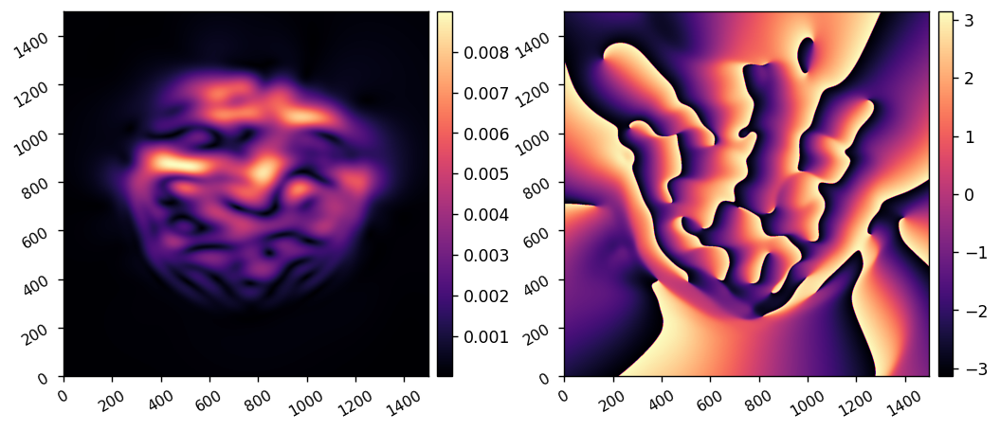

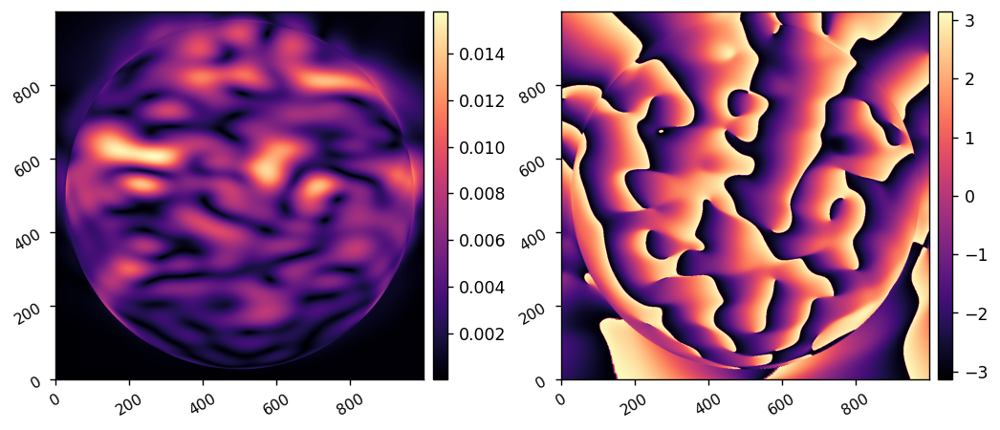

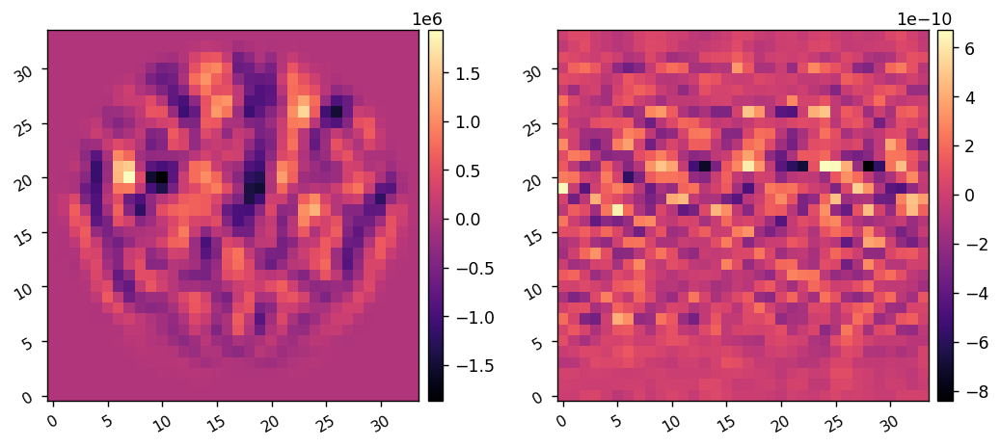

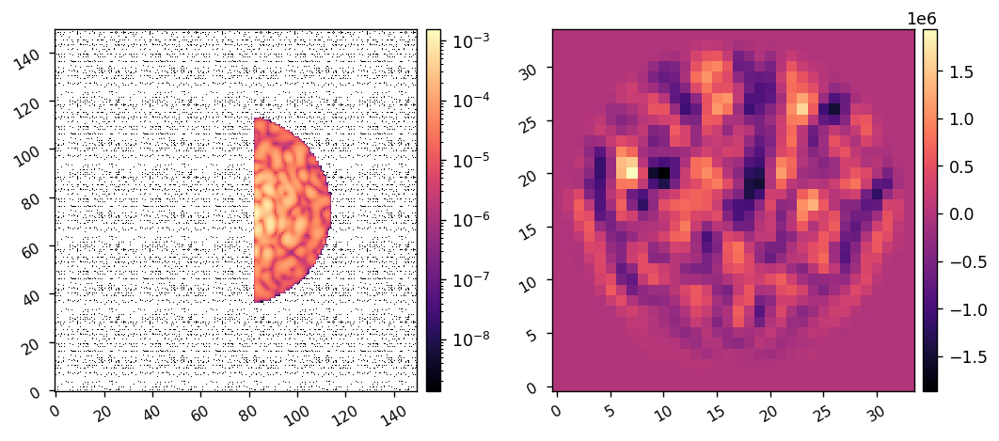

In [9]:
reload(rmad)

acts = np.zeros(I.Nacts)
# acts = fits.getdata('example-data/ad_test_acts.fits')

I.set_dm(rmad.acts_to_command(acts, I.dm_mask))
E_ab = I.calc_wf() * control_mask
r_cond = 1e-2

del_acts = np.zeros(M.Nacts)
J, dJ_dA = rmad.val_and_grad(del_acts, M, acts, E_ab, r_cond, control_mask, verbose=True, plot=True)

dm_grad = rmad.acts_to_command(dJ_dA, M.dm_mask)
imshow2(xp.abs(E_ab)**2, dm_grad, lognorm1=True)

In [10]:

acts = np.zeros(I.Nacts)
# acts = fits.getdata('example-data/ad_test_acts.fits')

I.set_dm(rmad.acts_to_command(acts, I.dm_mask))
E_ab = I.calc_wf() * control_mask
r_cond = 1e-3
bfgs_tol = 1e-3
bfgs_opts = {
    'disp':True,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

del_acts0 = np.zeros(M.Nacts)
res = minimize(rmad.val_and_grad, 
                jac=True, 
                x0=del_acts0,
                args=(M, acts, E_ab, r_cond, control_mask, True, False), 
                method='L-BFGS-B',
                tol=bfgs_tol,
                options=bfgs_opts,
                )


	Cost-function J_delE: 0.139
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 1.000

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          952     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.00000D+00    |proj g|=  1.93383D+06
	Cost-function J_delE: 0.002
	Cost-function J_c: 2495701154.761
	Cost-function normalization factor: 0.139
	Total cost-function value: 17988749393.974

	Cost-function J_delE: 0.014
	Cost-function J_c: 47.029
	Cost-function normalization factor: 0.139
	Total cost-function value: 339.076

	Cost-function J_delE: 0.163
	Cost-function J_c: 2.907
	Cost-function normalization factor: 0.139
	Total cost-function value: 22.130

	Cost-function J_delE: 0.828
	Cost-function J_c: 0.284
	Cost-function normalization factor: 0.139
	Total cost-function value: 8.020



 This problem is unconstrained.


	Cost-function J_delE: 2.596
	Cost-function J_c: 0.028
	Cost-function normalization factor: 0.139
	Total cost-function value: 18.910

	Cost-function J_delE: 1.010
	Cost-function J_c: 0.001
	Cost-function normalization factor: 0.139
	Total cost-function value: 7.286

	Cost-function J_delE: 0.143
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 1.032

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.987

	Cost-function J_delE: 0.139
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 1.000

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.985

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.990

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-functio


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


	Cost-function J_delE: 2.751
	Cost-function J_c: 0.025
	Cost-function normalization factor: 0.139
	Total cost-function value: 20.007

	Cost-function J_delE: 0.931
	Cost-function J_c: 0.001
	Cost-function normalization factor: 0.139
	Total cost-function value: 6.718

	Cost-function J_delE: 0.156
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 1.121

	Cost-function J_delE: 0.138
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.998

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.987

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.985

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-function normalization factor: 0.139
	Total cost-function value: 0.985

	Cost-function J_delE: 0.137
	Cost-function J_c: 0.000
	Cost-functio


 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  952      2     56      2     0     0   1.915D+06   9.845D-01
  F =  0.98445282395419309     

ABNORMAL_TERMINATION_IN_LNSRCH                              


7.802968465218757e-05 7.68155364316925e-05


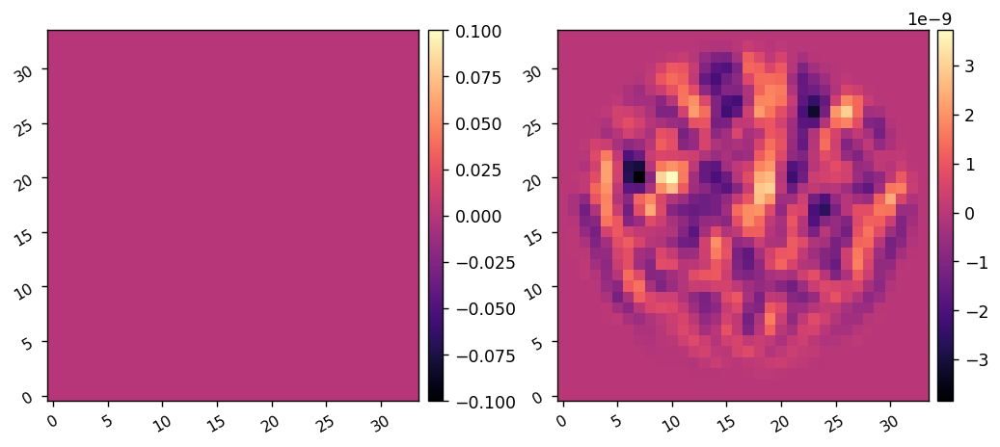

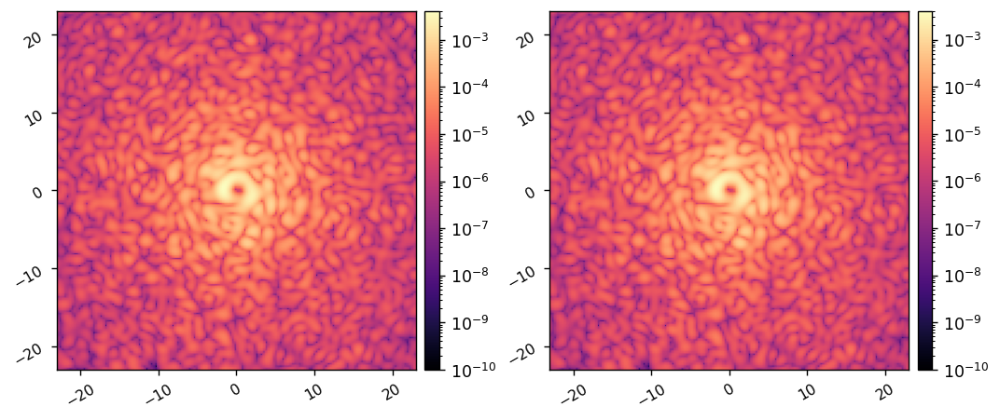

In [20]:
old_command = rmad.acts_to_command(acts, I.dm_mask)
del_command = rmad.acts_to_command(res.x, I.dm_mask)

I.set_dm(old_command)
old_im = I.snap()
I.set_dm(old_command + del_command)
new_im = I.snap()

print(xp.mean(old_im[control_mask]), xp.mean(new_im[control_mask]))
imshow2(old_command, del_command)
imshow2(old_im, new_im, lognorm=True, pxscl=I.psf_pixelscale_lamD, vmin1=1e-10, vmin2=1e-10)

In [ ]:
utils.save_fits('example-data/ad_test_acts.fits', res.x)

In [ ]:
I.zero_dm()
all_ims = []
all_efs = []
all_commands = []


Running estimation algorithm ...
Computing EFC command with L-BFGS


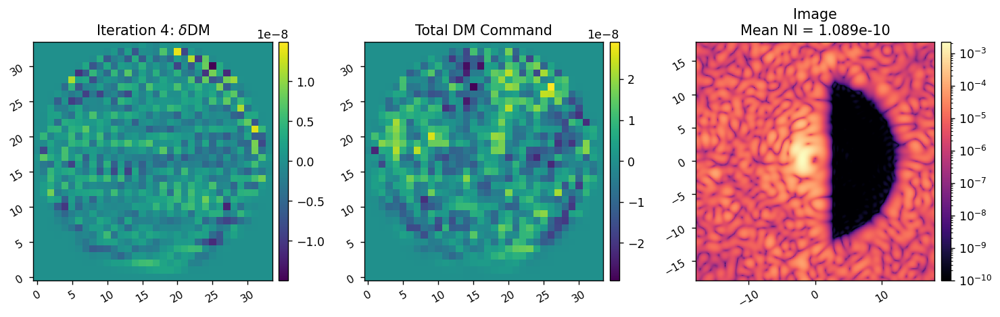

Running estimation algorithm ...
Computing EFC command with L-BFGS


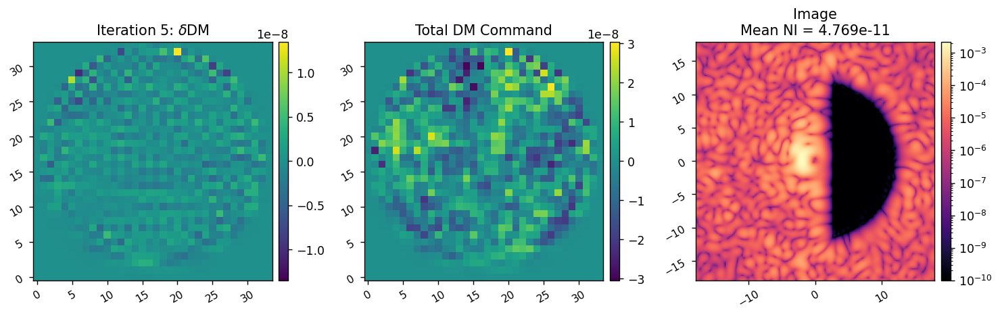

Running estimation algorithm ...
Computing EFC command with L-BFGS


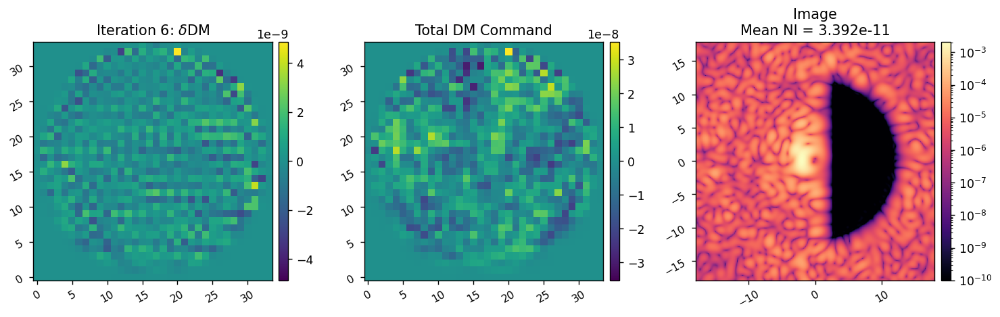

In [ ]:
reload(rmad)
reload(adefc)

r_cond = 1e-2
r_cond = 1e-3
# r_cond = 1e-4
r_cond = 1e-5
# r_cond = 1e-6

bfgs_tol = 1e-2
bfgs_tol = 1e-3
# bfgs_tol = 1e-4
bfgs_tol = 1e-5

bfgs_opts = {
    'disp':False,
    # 'ftol':1e-6,
    # 'gtol':1e-6,
}

all_ims, all_efs, all_commands = adefc.run(I, M, 
                                            rmad.val_and_grad, control_mask, 
                                            Nitr=3, 
                                            reg_cond=r_cond,
                                            bfgs_tol=bfgs_tol,
                                            bfgs_opts=bfgs_opts,
                                            gain=1,
                                            all_ims=all_ims,
                                            all_efs=all_efs,
                                            all_commands=all_commands,
                                            )